In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("ProjPart2.ipynb")

## Introduction

In Part 1 of this project, you performed some basic exploratory data analysis (EDA), laying out the thought process that leads to certain modeling decisions. Then, you added a few new features to the dataset, cleaning the data as well in the process.

In Part 2 of the project, you will specify and fit a linear model to a few features of the housing data to predict housing prices. Next, we will analyze the error of the model and brainstorm ways to improve the model's performance. Finally, we'll delve deeper into the implications of predictive modeling within the Cook County Assessor's Office (CCAO) case study, especially because statistical modeling is how the CCAO valuates properties. Given the history of racial discrimination in housing policy and property taxation in Cook County, consider the impacts of your modeling results as you work through this assignment - and think about what fairness might mean to property owners in Cook County.

After this part of the project, you should be comfortable with:
- Implementing a data processing pipeline using `pandas`
- Using `scikit-learn` to build and fit linear models



In [2]:
import hashlib

import numpy as np

import pandas as pd
from pandas.api.types import CategoricalDtype

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model as lm
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

import zipfile
import os

from ds100_utils import run_linear_regression_test

def get_hash(num):
    return hashlib.md5(str(num).encode()).hexdigest()

# Plot settings
plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.size'] = 12

Let's load the training and test data.

In [3]:
# RUN THIS  - DON'T COMMENT THIS OUT - it is needed for the autograder.

with zipfile.ZipFile('cook_county_data.zip') as item:
    item.extractall()

This dataset is split into a training/validation set, and a test set. Importantly, the test set does not contain values for our target variable, Sale Price. In this project, you will train a model on the training and validation sets and then use this model to predict the Sale Prices of the test set. In the cell below, we load the training and validation sets into the DataFrame `tr_val_data` and the test set into the DataFrame `test_data`.

In [4]:
tr_val_data = pd.read_csv("cook_county_train_val.csv", index_col='Unnamed: 0')
test_data = pd.read_csv("cook_county_contest_test.csv", index_col='Unnamed: 0')

In [5]:
len(test_data)

55311

As a good sanity check, we should at least verify that the data shape matches the description.

In [6]:
# 204792 observations and 62 features in training data
assert tr_val_data.shape == (204792, 62)
# 55311 observations and 61 features in test data
assert test_data.shape == (55311, 61)
# Sale Price is provided in the training/validation data
assert 'Sale Price' in tr_val_data.columns.values
# Sale Price is hidden in the test data
assert 'Sale Price' not in test_data.columns.values

Let's remind ourselves of the data available to us in the Cook County dataset. Remember, a more detailed description of each variable is included in `codebook.txt`, which is in the same directory as this notebook). **If you did not attempt Project Part 1,** you should take some time to familiarize yourself with the codebook before moving forward.

In [7]:
tr_val_data.columns.values


array(['PIN', 'Property Class', 'Neighborhood Code', 'Land Square Feet',
       'Town Code', 'Apartments', 'Wall Material', 'Roof Material',
       'Basement', 'Basement Finish', 'Central Heating', 'Other Heating',
       'Central Air', 'Fireplaces', 'Attic Type', 'Attic Finish',
       'Design Plan', 'Cathedral Ceiling', 'Construction Quality',
       'Site Desirability', 'Garage 1 Size', 'Garage 1 Material',
       'Garage 1 Attachment', 'Garage 1 Area', 'Garage 2 Size',
       'Garage 2 Material', 'Garage 2 Attachment', 'Garage 2 Area',
       'Porch', 'Other Improvements', 'Building Square Feet',
       'Repair Condition', 'Multi Code', 'Number of Commercial Units',
       'Estimate (Land)', 'Estimate (Building)', 'Deed No.', 'Sale Price',
       'Longitude', 'Latitude', 'Census Tract',
       'Multi Property Indicator', 'Modeling Group', 'Age', 'Use',
       "O'Hare Noise", 'Floodplain', 'Road Proximity', 'Sale Year',
       'Sale Quarter', 'Sale Half-Year', 'Sale Quarter of Year'

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 1: Human Context and Ethics

In this part of the project, we will explore the human context of our housing dataset.

**You should read the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/109109/modules/items/5659390) on Canvas explaining the context and history surrounding this dataset before attempting this section.**

<br>

--- 

<!-- BEGIN QUESTION -->

### Question 1a
In this project we are essentially trying to answer the question.  "How much is a house worth?" 
 - Who might be interested in an answer to this question? **Please list at least three different parties (people or organizations) and then describe whether each one has an interest in seeing the housing price to be either high or low.**

One type of party interested in this answer are realtors selling a house. They can use this information to either set a house price, or see how a house price may stack up to what its actual worth is.

Another type of party interested would be adults buying a house. Say they are interested in a house priced at a million dollars. They can ask and answer the question on how much the house is actually worth.

A final type of party interested would be those who already have a house and interested in selling it. Similar to the realators, they can see how much their house is worth to assist in setting a price.

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 1b

 - 1bi).  Which of the following scenarios strike you as unfair and why? You can choose more than one. There is no single right answer, but you must explain your reasoning.
 - 1bii). Would you consider some of these scenarios more (or less) fair than others? Why?

Scenario A: A homeowner whose home is assessed at a higher price than it would sell for.  
Scenario B: A homeowner whose home is assessed at a lower price than it would sell for.  
Scenario C: An assessment process that systematically overvalues inexpensive properties and undervalues expensive properties.  
Scenario D: An assessment process that systematically undervalues inexpensive properties and overvalues expensive properties.


Write your full answers to both parts in the cell below:

Scenerio A and B are unfair for similar reaasons. Lets take scenerio A for example. A home owner may have their house assessed higher than it is worth, and go through the process just to find out when selling it that it is worth less than it was assessed. They may not want to sell after that. For scenerio B, it is unfiar as a homewoenr may be resistant to sell their house because it does not seem worth as much as it is due to its assessment. In reality, the homeowner's house would sell for much more so there is a false indicator pushing the homeowner not to sell unknowningly.

Scenerio C is unfair, as it is assessess more expensive houses as cheaper and less expensive houses as more expensive. This is unfair as it would make those trying to sell expensive houses lose profit as the houses are assessed for cheaper, and thos trying to buy inexpsive houses struggle as they are asssessed as more expensive. Additonally, depending on the tax system, they may be overtaxed due to this system.

<!-- END QUESTION -->

---

### Question 1c

Consider a model that is fit to $n = 50$ training observations. We denote the response as $y$ (Log Sale Price), the prediction as $\hat{y}$, and the corresponding residual to be $y - \hat{y}$.   

Typically when we make a residual plot, we plot the residuals vs the predictions $\hat{y}$.  

However, in the plot below, we are plot the residuals vs the actual price of homes in the data $y$ (Log Sale Price), to be able to visualize for which prices of homes the model is generally overvaluing vs undervaluing. 



Which plot below corresponds to a model that might make property assessments that result in regressive taxation? (Refer to the [Project_CaseStudy.pdf](https://canvas.colorado.edu/courses/109109/modules/items/5659390) for a reminder of the definition of regressive taxation).  Assume that all three plots use the same vertical scale and that the horizontal line marks $y - \hat{y} = 0$. Assign `q1c` to the string letter corresponding to your plot choice.

**Hint:** When a model overvalues a property (predicts a `Sale Price` greater than the actual `Sale Price`), what are the relative sizes of $y$ and $\hat{y}$? What about when a model undervalues a property?

**Graded Via Hidden Test in Gradescope** Since this is a multiple choice question, the in-notebook check for this problem only checks that you entered a valid string, it does **NOT** check for correctness of your answer for this question - that will be graded when you submit to Gradescope.  

<img src='res_plots.png' width="900px" />


In [8]:
q1c = "C"

In [9]:
grader.check("q1c")

q1c results: All test cases passed!

## The CCAO Dataset

You'll work with the dataset from the Cook County Assessor's Office (CCAO) in Illinois. This government institution determines property taxes across most of Chicago's metropolitan areas and nearby suburbs. In the United States, all property owners must pay property taxes, which are then used to fund public services, including education, road maintenance, and sanitation. These property tax assessments are based on property values estimated using statistical models considering multiple factors, such as real estate value and construction cost.

This system, however, is not without flaws. In late 2017, a lawsuit was filed against the office of Cook County Assessor Joseph Berrios for producing "[racially discriminatory assessments and taxes](https://www.chicagotribune.com/politics/ct-cook-county-board-assessor-berrios-met-20170718-story.html)." The lawsuit included claims that the assessor's office undervalued high-priced homes and overvalued low-priced homes, creating a visible divide along racial lines: Wealthy homeowners, who were typically white, paid less in property taxes, whereas [working-class, non-white homeowners paid more](https://www.chicagotribune.com/news/breaking/ct-cook-county-assessor-berrios-sued-met-20171214-story.html).

The Chicago Tribune's four-part series, "[The Tax Divide](https://www.chicagotribune.com/investigations/ct-tax-divide-investigation-20180425-storygallery.html)", delves into how this was uncovered: After "compiling and analyzing more than 100 million property tax records from the years 2003 through 2015, along with thousands of pages of documents, then vetting the findings with top experts in the field," they discovered that "residential assessments had been so far off the mark for so many years." You can read more about their investigation  [in this news article](https://apps.chicagotribune.com/news/watchdog/cook-county-property-tax-divide/assessments.html).

**You should read the [Project Case Study.pdf](https://canvas.colorado.edu/courses/109109/modules/items/5659390)  explaining the history about this dataset before answering the following question.**

<!-- BEGIN QUESTION -->

### Question 1d

 - 1di).  What were the central problems with the earlier property tax system in Cook County as reported by the Chicago Tribune?
 - 1dii). What were the primary causes of these problems? (Note: in addition to reading the paragraph above you will need to **read the [Project Case Study.pdf](https://canvas.colorado.edu/courses/109109/modules/items/5659390)  explaining the context and history of this dataset  before answering this question).**

i. The Chicago Tribune reported that the "CCAO's model for estimating house values perptuated a highly regressive tax system that disproportionaly burdened Afriacn-American and Latinx homeowners in Cook County." A regressive tax rate means that the tax rate is higher for those with lower net income. The report found that when accounting for the homeowner's income the tax rate was indeed recessive.

ii. "Given wealtheir, whiter neighborhoods typically have greater access to lawyers, they often appealed more and won reductions far more oftaen than their less wealthy neighbors[...] those with higher incomes pay less in prorty tax, lax layers can gow their business due to their role in appeals, and politicians are socially connected to the aforementioned tax lawyers and wealthy homeowners. All these stakeholders have reasons to advertise the appeals system as an intergral part of a fair system." Essentially, because those with more money are more likely to win in court for tax reductions (with better lawyers due to their wealth), then the wealthier areas will decrease in tax rate compared to poorer areas who can not afford the more expensive lawyers and win these cases,

<!-- END QUESTION -->

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 2: More EDA

<br>

In good news you have already done a lot of EDA with this dataset in Project 1. 

Before fitting any model, we should check for any missing data, duplicate data and/or unusual outliers.

We know from Project Part 1, that the granularity of this dataset is that each row represents data from the sale of a specific property in Cook county between 2013-2019.

### Question 2a: More EDA


We'll start by checking to make sure that there aren't any duplicate rows (i.e. rows in which every entry is exactly the same).   We'll consider any duplicate rows to be a data entry error, as each row should represent a unique sale. 


As an example, let's say one sale is duplicated three times (i.e. 3 duplicate rows for that specific sale) and a different sale is duplicated 5 times.  In that scenario we would say there are 2 unique property sales that have duplicates, and we would need to remove a total of (5+3-2=6) extra rows of duplicate data.  


How many unique property sales in the `tr_val_data` have exact duplicates and what is the total number of duplicate rows we should remove? 

Assign your answers to `count_duplicate_properties` and `count_duplicate_rows_to_remove` below.

(Again, so in the toy example above, count_duplicate_properties=2 and count_duplicate_rows_to_remove=6).  

HINT:  Panda's `df.duplicated()` function may be useful here:  https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html



In [10]:

count_duplicate_properties = tr_val_data.duplicated(keep = False).sum() - tr_val_data.duplicated().sum()

count_duplicate_rows_to_remove = tr_val_data.duplicated().sum()

print("There are ", count_duplicate_properties, "unique property sales with exact duplicates.")
print("There are ", count_duplicate_rows_to_remove, "a total of duplicate rows that we'll need to remove when we write our cleaning function below.")

There are  5 unique property sales with exact duplicates.
There are  13 a total of duplicate rows that we'll need to remove when we write our cleaning function below.


In [11]:
grader.check("q2a")

q2a results: All test cases passed!

We will create a function in part 2d to clean the data (and remove these duplicates), but first we will look for any other unusual outliers in the data that we will want to remove as well.

<!-- BEGIN QUESTION -->


### Question 2b: 

Since we're trying to predict `Sale Price`, next we'll look for missing or unusual outliers in that field.

Examine the `Sale Price` column in the `training_val_data` DataFrame and answer the following questions:


 - 2bi).  Does the `Sale Price` data have any missing, N/A, negative or 0 values for the data?  If so, propose a way to handle this.

 - 2bii).  Does the `Sale Price` data have any unusually large outlier values?  If so, propose a cutoff to use for throwing out large outliers, and justify your reasoning).  

 - 2biii).  Does the `Sale Price` data have any unusually small outlier values?  If so, propose a cutoff to use for throwing out small outliers, and justify your reasoning.  
 
 
Below are three cells.  The first is a Markdown cell for you to write up your responses to all 3 parts above.
The second two are code cells that are available for you to write code to explore the outliers and/or visualize the Sale Price data.

### Question 2b i, ii, iii answer cell:   *Type your responses to all three parts in this cell...*

In [12]:
print(tr_val_data["Sale Price"].head(20))
print(tr_val_data["Sale Price"].tail(20))
#your code exploring Sale Price above this line

print("2bi. looking at Sale Price, we can see that there are no zeros, missing data, or N/A's.\n")

print("2bii looking at Sale Price, there does not appear to be any large outliers. We can double check this with a conditional:")

val = tr_val_data[tr_val_data["Sale Price"] > 50000000]

print(val["Sale Price"].head(10))

print("Since there is a proprty well above 50 million dollars, and only one, this property is likely a large outlier. If there were multiple houses in this range or above 50 million, then I would say it is not an outlier, however, there is only one proprty that high")


val = tr_val_data[tr_val_data["Sale Price"] > 10000000]

print(val["Sale Price"].head(10))

print("Here we can see that there are 3 houses worth 12 mil, 28 mil, then 71 mil. I am going to set the cutoff of 13 mil, as the difference between 28 mil and 71 mil is more than double, \nand the difference between 12 mil and 28 mil is also more than double. Although 12 mil is high, there are multiple 12 million dollar houses.")


print("\n2biii: As seen in the prints of the heads and tails above, there seems to be multiple properties worth 1 dollar. This is certainly an outlier, as there is no other value close to that low (apart from the 1 dollar properties.")

#Here we can see there is 



0          1
1     285000
2      22000
3     225000
4      22600
5          1
6     100000
7     795000
8     675000
9     270000
10    120000
11     72000
12    491750
13    487000
14         1
15    255000
16    380000
17     88000
18    146000
19     65000
Name: Sale Price, dtype: int64
204772     199500
204773          1
204774    1175000
204775     465000
204776     652500
204777     176000
204778     940000
204779      20050
204780      60000
204781      54900
204782          1
204783     460000
204784     135000
204785     125000
204786     287500
204787      37100
204788     225000
204789     135000
204790     392000
204791     125000
Name: Sale Price, dtype: int64
2bi. looking at Sale Price, we can see that there are no zeros, missing data, or N/A's.

2bii looking at Sale Price, there does not appear to be any large outliers. We can double check this with a conditional:
106057    71000000
Name: Sale Price, dtype: int64
Since there is a proprty well above 50 million dollars, an

In [13]:
...
# optional extra cell for exploring code

Ellipsis

<!-- END QUESTION -->

**Pure Market Filter**

As you (hopefully) noticed, there are quite a few small values for the Sale Price of a home that don't make sense.  This can happen when someone sells a house to a relative for $\$1$ or some other price that is not reflective of the true market value.  There are also several extremely large outliers (houses that sold for more than $10 million) that don't accurately capture the true market value of a home.

It turns out, there's actually an indicator feature already available in the dataset to help filter out any sale transactions that aren't considered "Pure Market Transactions"  (for example, when someone sells a house to a relative for $\$1$, we don't consider that a transaction driven by the true market value of the house).



### Question 2c

To understand the cutoffs used by this filter, determine the max and min Sale Price values for the subset of data in the training_val dataset with the indicator `Pure Market Filter` = 1.



In [14]:
filter_1 = tr_val_data[tr_val_data["Pure Market Filter"] == 1]

max_Sale_Price_filtered = filter_1["Sale Price"].max()

min_Sale_Price_filtered = filter_1["Sale Price"].min()

print("When considering only pure market sales, the max Sale Price of properties in the data is $", max_Sale_Price_filtered)
print("and the min Sale Price is $", min_Sale_Price_filtered)

When considering only pure market sales, the max Sale Price of properties in the data is $ 8490078
and the min Sale Price is $ 10003


In [15]:
grader.check("q2c")

q2c results: All test cases passed!

### Question 2d

Create a function `clean_data` that takes in a dataframe of property sales `data` and cleans the data as follows:

 - Removes duplicate rows (for example, instead of 3 rows of duplicate data for a unique property sale, we would only keep 1 row with that information),
 - Filters out outliers in Sale Price by only keeping rows with "Pure Market Filter" = 1


In [16]:

def clean_data(data):

    '''
    Cleans the data DataFrame by removing duplicate rows and removing rows with 'Pure Market Filter = 1'

    Args:
        data (DataFrame):  DataFrame to clean
        
    Return:
        Cleaned DataFrame
    '''
    
    da = data.copy()
    
    da = da.drop_duplicates(keep = "first")
    
    
    da = da[da["Pure Market Filter"] == 1]

    # Do NOT reset the index of the cleaned data.
    
    return da




In [17]:
grader.check("q2d")

q2d results: All test cases passed!

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 3: Cross Validation

In this project we are going to create and compare models to predict the Sale Price of properties in Cook County.  

If we used all the available data to fit and compare our models, we would not have a way to estimate model performance on **unseen data** such as the test set in `cook_county_contest_test.csv`.

We'll start by using Simple Cross Validation to fit and evaluate our models.  This involves taking the `tr_val_clean` data and actually splitting it into a training and validation set.  

We will use the training set to fit each model's parameters and the validation set to evaluate how well each model will likely perform on unseen data drawn from the same distribution. 


In the cell below, complete the function train_val_split that splits an input DataFrame data into two smaller DataFrames named train and validation, where validation contains the **first** 20% of the rows in input DataFrame and train contains the remaining 80% of the data.  Do not shuffle the input DataFrame inside the function. You should not be importing any additional libraries for this question.

(If the cutoff for the first 20% of the data is not an exact integer, round down to the nearest integer).




In [18]:
def train_val_split(data):
    """ 
    Takes in a DataFrame `data` and splits it into two smaller DataFrames 
    named `validation` and `train` where validation is the first 20% of the rows and train 
    is the last 80% of the rows, respectively. 
    If the the first 20% of the data is not an exact integer, round down to the nearest integer.
    Do not shuffle or re-index the data DataFrame.  
    """
    da = data.copy()
    
    
    size = len(da)
    twenty = (size * .2)
    twenty = int(twenty)
    validation = da.head(twenty)
        
    
    train = da.tail(size - twenty)
   
    
    return train, validation



# To randomize the validation and training sets, we will shuffle the data once before 
# running it through the train_val split function
# Do not change the random_state seed in this code - it will ensure reproducibility so 
# you can pass the in-notebook test cases
tr_val_data_shuffled = tr_val_data.sample(frac=1, random_state=18)



# Clean the shuffled data
tr_val_clean = clean_data(tr_val_data_shuffled) 

# Create the train/val split on the cleaned, shuffled data:
tr, val = train_val_split(tr_val_clean)



In [19]:
grader.check("q3")

q3 results: All test cases passed!

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 4: Fitting a Simple Linear Regression Model

In Part 1 of the project, you plotted the log-transformed Sale Price vs the log-transformed total area covered by the building (in square feet)  and saw there was a positive linear association.  Let's start the modeling process by fitting a simple linear regression model using this predictor.  

Our first model will take the form:

$$
\text{Log Sale Price} = \theta_0 + \theta_1 \cdot (\text{Log Building Square Feet})
$$






<br>

--- 
## Modeling Step 1:  Feature Transformation

<br>



## Create a pipeline to process the data

It is time to prepare the training and validation data for the model we proposed above. 

In Project Part 1, you wrote a few functions that added features to the dataset. Instead of calling them manually one by one each time, it is best practice to encapsulate all of this feature engineering into one "pipeline" function. Defining and using a pipeline reduces all the feature engineering to just one function call and ensures that the same transformations are applied to all data.  


### Question 4a:


For an example of how to work with pipelines, you will complete the missing code in the `process_data_m1` function in the cell below. 


In particular, the cell below completes the following steps:

  1. Creates a function `process_data_m1` to perform the following feature engineering:  
     - Applies log transformations to the `Sale Price` and the `Building Square Feet` columns to create two new columns, `Log Sale Price` and `Log Building Square Feet`.
     - Outputs a DataFrame with only the columns used in model 1 (that is `Log Sale Price` , `Log Building Square Feet`)
 
 2. The code in the cell then runs `process_data_m1` separately on the training data and then the validation data.  It then creates the design matrix $\mathbb{X}$ and the observed vector $\mathbb{Y}$ for both the training data and the validation data (and saves them in the variable names `X_train_m1`, `Y_train_m1`, `X_valid_m1`, `Y_valid_m1`). Note that $\mathbb{Y}$ refers to the transformed `Log Sale Price`, not the original `Sale Price`. **X  should be a `pandas` DataFrame and the observed Y vector should be a `pandas` Series.**


Fill in the missing code in the cell below:


In [20]:


def process_data_m1(df):
    """ 
    Takes in a DataFrame of cleaned data and performs feature engineering to use for Model 1.

    Outputs a DataFrame with only the features and response/output used in model 1 (that is `Log Sale Price` , `Log Building Square Feet`)
 
    """
    
    data=df.copy()
    
    # Add a column "Log Sale Price" to the `data` DataFrame:

    data["Log Sale Price"] = np.log(data["Sale Price"])
    
    # Add a column "Log Building Square Feet" to the `data` DataFrame:

    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    
    # Select the feature and the output/response used in model 1:
    
    data = data[['Log Building Square Feet', 'Log Sale Price']]
    
    return data



# Process both the training and validation data: 

processed_train_m1 = process_data_m1(tr)

processed_val_m1 = process_data_m1(val)


# Create X (dataframe) and Y (series) to use to train the model:
X_train_m1 = processed_train_m1.drop(columns = "Log Sale Price")
y_train_m1 = processed_train_m1["Log Sale Price"]


# Create X (dataframe) and Y (series) to use to validate the model:
X_valid_m1 = processed_val_m1.drop(columns = "Log Sale Price")
y_valid_m1 = processed_val_m1["Log Sale Price"]

# Take a look at the results
print("Training Data: X")
display(X_train_m1.head())
print("Training Data: y")
display(y_train_m1.head())


print("Validation Data: X")
display(X_valid_m1.head())
print("Validation Data: y")
display(y_valid_m1.head())


Training Data: X


,Log Building Square Feet
21302,6.871091
19451,7.576610
32018,6.891626
144262,7.186901
197227,7.576610


Training Data: y


21302     11.738466
19451     12.100712
32018     12.577291
144262    12.502467
197227    12.449019
Name: Log Sale Price, dtype: float64

Validation Data: X


,Log Building Square Feet
17112,7.487174
189337,7.688913
141725,6.985642
9776,6.846943
81676,7.096721


Validation Data: y


17112     12.100707
189337    12.460715
141725    12.165251
9776      11.982929
81676     11.719940
Name: Log Sale Price, dtype: float64

In [21]:
grader.check("q4a")

q4a results: All test cases passed!

## Modeling Step 2:  Create a linear model

Next we'll use `sci-kit learn` to train the model.



### Question 4b


We first initialize a [`sklearn.linear_model.LinearRegression`](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) object for our model. 


Fill in the missing code below to fit the model using the training set.  Then output the model's predictions for both the training and validation set.  

In [22]:
linear_model_m1 = lm.LinearRegression()

# Fit the model using the processed training data:

X = X_train_m1

Y = y_train_m1

linear_model_m1 = lm.LinearRegression().fit(X, Y)


# Compute the predicted y values from linear model 1 (in units log sale price) 
# using the training data as input:

y_predict_train_m1 = linear_model_m1.predict(X_train_m1)

# Compute the predicted y values from linear model 1 (in units log(sale price))
# using the validation data as input:

y_predict_valid_m1 = linear_model_m1.predict(X_valid_m1)

In [23]:
grader.check("q4b")

q4b results: All test cases passed!

<br>


## Modeling Step 3:  Model Evaluation Using RMSE


We'll compare the performance of our models using the Root Mean Squared Error (RMSE) function.

$$RMSE = \sqrt{\dfrac{\sum_{\text{houses in the set}}(\text{actual price for house} - \text{predicted price for house})^2}{\text{number of houses}}}$$


### QUESTION 4c:

Complete the code below for the funtion RMSE:

In [24]:
def rmse(predicted, actual):
    """
    Calculates RMSE from actual and predicted values
    Input:
      predicted (1D array): vector of predicted/fitted values
      actual (1D array): vector of actual values
    Output:
      a float, the root-mean square error
    """
    sumAll = ((actual - predicted)**2).sum()
    return (sumAll/len(predicted))**.5

In [25]:
grader.check("q4c")

q4c results: All test cases passed!

In [26]:
# Just run this cell to create arrays to store the RMSE information from the models

model_names=["M1: log(bsqft)", "M2", "M3"]

# Create arrays where we can keep track of training and validation RMSE for each model

training_error_log = np.zeros(4)
validation_error_log = np.zeros(4)

training_error = np.zeros(4)
validation_error = np.zeros(4)

# Array to track cross validation errors average RMSE errors  

cv_error = np.zeros(4)


### QUESTION 4d:



In the cell below use your `rmse` function to calculate the training error and validation error for model 1.

Assign the RMSE of the predicted log sale prices and the actual log sale prices to the following variables: 

 `training_error_log[0]`  and    `validation_error_log[0]`


Since the target variable we are working with is log-transformed, it can also be beneficial to transform it back to its original form so we will have more context on how our model is performing when compared to actual housing prices.  In other words we want the RMSE **with regard to `Sale Price`**. Remember to exponentiate your predictions and response vectors before computing the RMSE using the `rmse` function and assign it to the following:

`training_error[0]` and    `validation_error[0]`



### Keeping track of all the models.

In this notebook (and in life) we will want to keep track of all our models. 
For this part of the project you will be creating 3 different versions of the model.

In [27]:
# Training and validation RMSE for the model (in units log sale price)

training_error_log[0] = rmse(y_predict_train_m1, y_train_m1)
validation_error_log[0]= rmse(y_predict_valid_m1, y_valid_m1)


# Training and validation RMSE for the model (in its original dollar values before the log transform)

training_error[0] = rmse(np.e**y_predict_train_m1, np.e**y_train_m1)
validation_error[0] = rmse(np.e**y_predict_valid_m1, np.e**y_valid_m1)

print("1st Model \nTraining RMSE: $ {}\nValidation RMSE: $ {}\n".format(training_error[0], validation_error[0]))


1st Model 
Training RMSE: $ 250644.12291590916
Validation RMSE: $ 253469.9713346675



In [28]:
grader.check("q4d")

q4d results: All test cases passed!

## Modeling Step 4: Cross Validation

To check that the validation RMSE is representative of the dataset we'll also perform a 5-fold cross validation on the model.

Scikit-learn has built-in support for cross-validation. 

Run the cell below to see how the SKlearn KFold object breaks up the data into 5 folds (by providing the positional indices: purely integer-location based indexing for selection by position, i.e. what you would use in .iloc) for the training and validation sets for each fold.


In [29]:
# Run this cell and read through the output to understand how kf.split returns the positional indices for each split:

from sklearn.model_selection import KFold

kf = KFold(n_splits=5) 

i = 1

a = []

for train_idx, valid_idx in kf.split(tr_val_clean):
    print ("positional (iloc) indices for training data for fold", i)
    print (train_idx)
    print ("positional (iloc) indices for validation data for fold", i)
    print (valid_idx)
    i = i+1
   


positional (iloc) indices for training data for fold 1
[ 33475  33476  33477 ... 167372 167373 167374]
positional (iloc) indices for validation data for fold 1
[    0     1     2 ... 33472 33473 33474]
positional (iloc) indices for training data for fold 2
[     0      1      2 ... 167372 167373 167374]
positional (iloc) indices for validation data for fold 2
[33475 33476 33477 ... 66947 66948 66949]
positional (iloc) indices for training data for fold 3
[     0      1      2 ... 167372 167373 167374]
positional (iloc) indices for validation data for fold 3
[ 66950  66951  66952 ... 100422 100423 100424]
positional (iloc) indices for training data for fold 4
[     0      1      2 ... 167372 167373 167374]
positional (iloc) indices for validation data for fold 4
[100425 100426 100427 ... 133897 133898 133899]
positional (iloc) indices for training data for fold 5
[     0      1      2 ... 133897 133898 133899]
positional (iloc) indices for validation data for fold 5
[133900 133901 13390



### Question 4e:

To better understand how cross-validation works, complete the following function which cross-validates a given model.

Use sklearn's KFold.split [documentation](https://scikit-learn.org/dev/modules/generated/sklearn.model_selection.KFold.html) function to get 5 splits on the training data. Note that split returns the positional indices of the data for that split.

For each split:
 - Select the training and validation rows and columns based on the split indices and features.
 - Compute the RMSE on the validation split (in units Sale Price, NOT log Sale Price)
 - Return the average RMSE across all cross-validation splits.

Fill in the missing code below:

In [30]:
from sklearn.model_selection import KFold
from sklearn.base import clone

def cross_validate_rmse(model, X, y):
    '''
    Split the X and y data into 5 subsets.
    For each subset, 
        - Fit a model holding out that subset.
        - Compute the RMSE (in units dollars, not log(dollars) on that subset (the validation set).
    You should be fitting 5 models in total.
    Return the average RMSE of these 5 folds.

    Args:
        model: An sklearn model with fit and predict functions. 
        X (DataFrame):  DataFrame of training/val data, whose columns are the features to use in model (i.e. that have already been processed through the model pipeline) 
        y (Series): Series of training/val data whose values are the response/output variable that has been processed through the model pipeline
    
    Return:
        The average validation RMSE for the 5 splits.
    '''
    # Make a copy of the model to use in this function
    model = clone(model)

    # Initialize sklearn's KFold object 
    kf = KFold(n_splits=5)  

    # Create a list to store the validation_rmse for each fold
    validation_rmse = []
    
    for train_idx, valid_idx in kf.split(X):
       
        # Use the provided train_idx and valid_idx to split the data for each fold:
        # Recall, train_idx and valid_idx are purely integer-location based indexing for selection by position.
        
        split_X_train, split_X_valid = X.iloc[train_idx], X.iloc[valid_idx]
        split_Y_train, split_Y_valid = y.iloc[train_idx], y.iloc[valid_idx]

        # Fit the model on the training split:
        model.fit(split_X_train, split_Y_train)
        
        # Compute the RMSE (in units dollars, not log(dollars)) on the validation split:
        
        y_predict = model.predict(split_X_valid)
        
        error = rmse(np.e**y_predict, np.e**split_Y_valid)
    

        validation_rmse.append(error)
        

        #Return the average validation rmse across all cross-validation splits.

    cv_error = (sum(validation_rmse))/len(validation_rmse)
              
        
    return cv_error
       
    
# Create a new model to use for cross validation of m1 
linear_model_m1_cv = lm.LinearRegression()


# Process the `tr_val_clean` DataFrame using the function `process_data_m1`
processed_full_m1 = process_data_m1(tr_val_clean)

# Split the processed_full_m1 DataFrame into a DataFrame X and a Series y to use in the cross_validation_rmse function.
X_full_m1 = processed_full_m1.drop(columns = "Log Sale Price")
y_full_m1 = processed_full_m1["Log Sale Price"]
# X_valid_m1 = processed_val_m1.drop(columns = "Log Sale Price")
# y_valid_m1 = processed_val_m1["Log Sale Price"]



# Call the `cross_validate_rmse` function you wrote above to calculate the cross_validation RMSE for model 1:
cv_error_m1  = cross_validate_rmse(linear_model_m1_cv, X_full_m1, y_full_m1)

# Save the cross validation error for model 1 to compare with other models.
cv_error[0] = cv_error_m1

print("1st Model Cross Validation RMSE: {}".format(cv_error[0]))

1st Model Cross Validation RMSE: 251013.91110890545


In [31]:
grader.check("q4e")

q4e results: All test cases passed!

## Modeling Step 5: Visualizations

## Visualizing RMSE

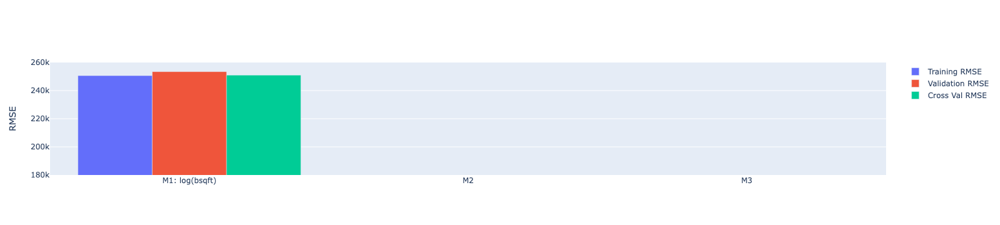

In [32]:
# Just run this cell.  It creates a visualization of the RMSE for Model 1

import plotly.graph_objects as go

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig

Notice that our cross-validation RMSE is pretty high given that it's in the units of dollars and measures our error when predicting sale prices of a house.  We will want to improve this model!

<br>

--- 

## Visualizing Residual Plots

Another way of understanding a model's performance (and appropriateness) is through a plot of the residuals versus the observations.  We will use the validation data to create these plots.

In the cells below, use [`plt.scatter`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html) to plot
2 side-by-side residual plots:

 - The first plot should be of the residuals from predicting `Log Sale Price` using the model versus  the **predicted** `Log Sale Price` for the **validation data**. 
 - The second plot should be the residuals from predicting `Log Sale Price` using the model versus the **actual** `Log Sale Price` for the **validation data**. 

We will keep the residuals in terms of units of log to make it easier to spot trends.

With such a large dataset, it is difficult to avoid overplotting entirely. We set the dot size and opacity in the scatter plot to reduce the impact of overplotting as much as possible.

## QUESTION 4f:  Complete the code below to plot the residual plots

Text(0.5, 1.0, 'Model 1 Val Data: Residuals vs. Log(Sale Price)')

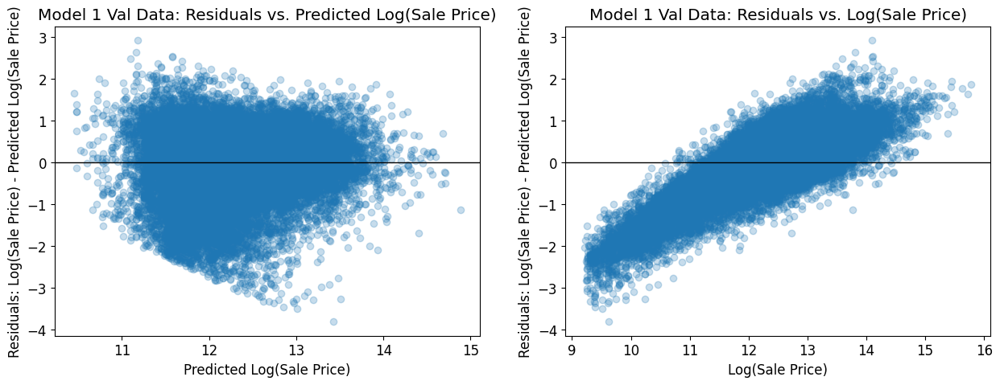

In [33]:
fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = y_predict_valid_m1
y_plt1 = y_valid_m1 - y_predict_valid_m1

x_plt2 = y_valid_m1
y_plt2 = y_valid_m1 - y_predict_valid_m1



ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 1 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 1 Val Data: Residuals vs. Log(Sale Price)")

In [34]:
grader.check("q4f")

q4f results: All test cases passed!

**NOTE** Notice in the first plot it appears that the lower part of the plot is cutoff along an angled line - this is due to us filtering the data by only considering "Pure Market Filter" = 1, it is not a "pattern" in the residuals that we should try to address.

<br>


--- 

### Question 4g

Based on the structure you see in your residual plots, does this model seem like it will correspond to _regressive_, _fair_, or _progressive_ taxation?

Assign the string "regressive", "fair" or "progressive" to `q4g` in the cell below accordingly.

**Hidden test in Gradescope**:  Since this is a question with only 3 possible answers, the in-notebook test will only check if you have the correct format for your answer, it won't check if your actual answer is correct. 

In [35]:
q4g = "progressive"

In [36]:
grader.check("q4g")

q4g results: All test cases passed!

<br/>
<hr style="border: 5px solid #003262;" />
<hr style="border: 1px solid #fdb515;" />

## Question 5:  Adding a New Feature


While our simple model explains some of the variability in price, there is certainly still a lot of room for improvement to be made -- one reason is we have been only utilizing 1 feature (out of a total of 60+) so far! 

### Choosing Candidate Predictors to Add to Model



To see if additional variables might be helpful, we can plot the residuals from the fitted model against a variable that is not in the model. If we see patterns, that indicates we might want to include this additional feature or a transformation of it. 

In Project Part 1, you conducted feature transformation to create several other features related to the Sale Price including `Bedrooms` and `Roof Material`.
Let's examine plots of the residuals from Model 1 vs each of these features.

We have automatically imported staff implementations of the functions you wrote in Project 1 (these are stored in `feature_func.py`).  You are welcome to copy over your own implementations from Project 1 if you'd prefer. 

These functions are:

 - `add_total_bedrooms`, 
 - `find_expensive_neighborhoods`, 
 - `add_in_expensive_neighborhood`,
 - `ohe_roof_material`,
 -  `remove_outliers`,  


In [37]:
# Just run this cell - it creates the columns of the 2 additional features 
# we're interested in considering to add to the model 
# and appends the residual data from Model 1, so we can easily visualize

from feature_func import *


def process_data_candidates(df):
    
    data = df.copy()
    
    data["Log Sale Price"] = np.log(data["Sale Price"])
    
    # Create Log Building Square Feet column
    data["Log Building Square Feet"] = np.log(data["Building Square Feet"])
    
    
    # Create Bedrooms
    data = add_total_bedrooms(data)
     
   
    # Update Roof Material feature with names
    data = substitute_roof_material(data)

    
    # Select columns for comparing residuals
    data = data[['Log Building Square Feet',  'Roof Material', 'Bedrooms', 'Log Sale Price']]

    return data


#Since our residuals are using the validation data, we will just examine these new features on the validation dataset
    
valid_comp = process_data_candidates(val)
    
valid_comp = valid_comp.assign(M1residuals_log=y_valid_m1 - y_predict_valid_m1)


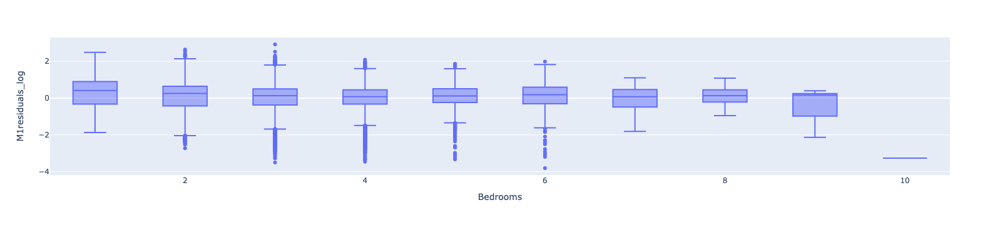

In [38]:
# Run this cell to compare residuals with Bedrooms

import plotly.express as px

px.box(valid_comp, x='Bedrooms', y='M1residuals_log')


Notice, with the exception of the outlier (the properties with 10 bedrooms), the medians of each boxplot align pretty close to 0 on the y-axis (meaning there is no major trend in prediction errors by Number of Bedrooms).

This means we do NOT expect adding the features Bedrooms will help improve our original model. 

What about Roof Material?


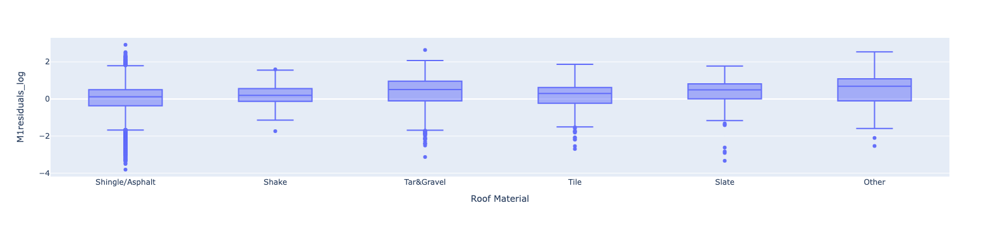

In [39]:
# Run this cell to compare residuals vs Roof Material

px.box(valid_comp, x='Roof Material', y='M1residuals_log')

The plot above shows us that the distribution of errors appears to change slightly based on Roof Material. Ideally, the median of each  box plot lines up with 0 on the y-axis (meaning there was no difference in prediction by Roof Material type). Instead, we see some variation from 0 for all except Shingle/Asphalt.   These patterns suggest that we may want to try including Roof Material in the model.


## Question 5a:  Model 2

Let's add `Roof Material` as a predictor in our model.  We will transform the column to be in terms of the Room Material names (like you did in Project Part 1, instead of the number codes).   In other words, let's consider a model of the form:

Model 2: 
$$\text{Log Sale Price} =  \theta_1(\text{Log Building Square Feet})  +\theta_2 (\text{Shingle/Asphalt}) $$

$$+ \theta_3 (\text{Tar\&Gravel}) + \theta_4  (\text{Tile})+ \theta_5 (\text{Shake})+  \theta_6(\text{Other})+\theta_7(\text{Slate})$$




**Note:** This will require one-hot-encoding Roof Material.  Notice since we're one-hot-encoding we don't need to include an extra intercept term in the model. 

In the cells below fill in the code to create a function `process_data_m2` to apply feature transformations to the features we'll use in Model 2

#### Modeling Step 1:  Process the Data


In [40]:
# Modeling Step 1:  Process the Data

# Hint: You can either use your implementation of the 
# One Hot Encoding Function from Project Part 1, or use the staff's implementation 
# imported from the feature_func.py file:

from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder()

from feature_func import *

...
# Optional:  Define any helper functions you need for one-hot encoding above this line


def process_data_m2(df):

    """ 
    Takes in a DataFrame of cleaned data and performs feature engineering to use for Model 2.
    Includes creating a Log Sale Price column, a Log Building Square Feet Column, 
    and one-hot encoding roof materials to use in the model.
    Once you have one-hot encoded the roof materials, you should drop the 
    original (not encoded) column `Roof Material` as it will not be used in the model.

    Outputs a DataFrame with only the features and response/output used in model 2.  
 
    """

#     data = df.copy()
    
#     ohe.fit(data[["Roof Material"]])
#     encoded_names = ohe.transform(data[["Roof Material"]]).todense()
    
#     encoded_df = pd.DataFrame(encoded_names, columns=ohe.get_feature_names_out(), index = data.index)
#     #data["Roof Material_MATERIAL"] = pd.DataFrame(encoded_names, columns=ohe.get_feature_names_out(), index = data.index)


    
#     data = data.join(encoded_df)

#     data["Log Sale Price"] = np.log(data["Sale Price"])
#     data["Log Building Square Feet"] = np.log(data["Building Square Feet"])    
    
#     #data = data.drop(columns = "Roof Material")
#     # print(ohe_demo)
    
    
#     return data
#---------------------------------------------------
    data = df.copy()
    #given - Update Roof Material feature with names in example
    data = substitute_roof_material(data)
    
    #projet 1
    df = ohe_roof_material(data)
    df = df.filter(regex='^Roof Material')
    
    
    #create columns from original data set
    df["Log Sale Price"] = np.log(data["Sale Price"])
    df["Log Building Square Feet"] = np.log(data["Building Square Feet"]) 
   
   
    

    df = df.drop(columns = "Roof Material")
    
    #return df
    #order by equation
    df = df.reindex(columns = ["Log Sale Price", "Log Building Square Feet", "Roof Material_Shingle/Asphalt", "Roof Material_Tar&Gravel", "Roof Material_Tile", "Roof Material_Shake", "Roof Material_Other", "Roof Material_Slate"])
    return df

   

    

# Use the same `tr` and `val` datasets from Question 3 (otherwise the validation errors aren't comparable), 
# Don't resplit the data.  

# Process the data for Model 2
processed_train_m2 = process_data_m2(tr)

processed_val_m2 = process_data_m2(val)


# Create X (dataframe) and Y (series) to use in the model
X_train_m2 = processed_train_m2.drop(columns = "Log Sale Price")
y_train_m2 = processed_train_m2["Log Sale Price"]



X_valid_m2 = processed_val_m2.drop(columns = "Log Sale Price")
y_valid_m2 = processed_val_m2["Log Sale Price"]


# Create X (dataframe) and Y (series) to use to train the model:
# X_train_m1 = processed_train_m2.drop(columns = "Log Sale Price")
# y_train_m1 = processed_train_m1["Log Sale Price"]


# # Create X (dataframe) and Y (series) to use to validate the model:
# X_valid_m1 = processed_val_m1.drop(columns = "Log Sale Price")
# y_valid_m1 = processed_val_m1["Log Sale Price"]


# Take a look at the result
display(X_train_m2.head())
display(y_train_m2.head())

display(X_valid_m2.head())
display(y_valid_m2.head())


,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate
21302,6.871091,1.0,0.0,0.0,0.0,0.0,0.0
19451,7.576610,1.0,0.0,0.0,0.0,0.0,0.0
32018,6.891626,1.0,0.0,0.0,0.0,0.0,0.0
144262,7.186901,1.0,0.0,0.0,0.0,0.0,0.0
197227,7.576610,1.0,0.0,0.0,0.0,0.0,0.0


21302     11.738466
19451     12.100712
32018     12.577291
144262    12.502467
197227    12.449019
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate
17112,7.487174,1.0,0.0,0.0,0.0,0.0,0.0
189337,7.688913,1.0,0.0,0.0,0.0,0.0,0.0
141725,6.985642,1.0,0.0,0.0,0.0,0.0,0.0
9776,6.846943,1.0,0.0,0.0,0.0,0.0,0.0
81676,7.096721,1.0,0.0,0.0,0.0,0.0,0.0


17112     12.100707
189337    12.460715
141725    12.165251
9776      11.982929
81676     11.719940
Name: Log Sale Price, dtype: float64

In [41]:
grader.check("q5ai")

q5ai results: All test cases passed!

#### Modeling STEP 2:  Create a Multiple Linear Regression Model

In [42]:
# Modeling STEP 2:  Create and Fit a Multiple Linear Regression Model

linear_model_m2 = lm.LinearRegression()
X = X_train_m2

Y = y_train_m2

linear_model_m2 = lm.LinearRegression().fit(X, Y)
# your code above this line to create and fit regression model for Model 2

y_predict_train_m2 = linear_model_m2.predict(X_train_m2)

y_predict_valid_m2 = linear_model_m2.predict(X_valid_m2)

#-------------------------------------------------------------------------------------------------------------------------
# linear_model_m1 = lm.LinearRegression()

# # Fit the model using the processed training data:

# X = X_train_m1

# Y = y_train_m1

# linear_model_m1 = lm.LinearRegression().fit(X, Y)


# # Compute the predicted y values from linear model 1 (in units log sale price) 
# # using the training data as input:

# y_predict_train_m1 = linear_model_m1.predict(X_train_m1)

# # Compute the predicted y values from linear model 1 (in units log(sale price))
# # using the validation data as input:

# y_predict_valid_m1 = linear_model_m1.predict(X_valid_m1)


In [43]:
grader.check("q5aii")

q5aii results: All test cases passed!

#### MODELING STEP 3:  Evaluate the RMSE for your model

In [44]:
# MODELING STEP 3:  Evaluate the RMSE for your model


# Training and test errors for the model (in its original values of dollars, not log)
training_error[1] = rmse(np.e**y_predict_train_m2, np.e**y_train_m2)
validation_error[1] = rmse(np.e**y_predict_valid_m2, np.e**y_valid_m2)



# # Training and validation RMSE for the model (in units log sale price)

# training_error_log[0] = rmse(y_predict_train_m1, y_train_m1)
# validation_error_log[0]= rmse(y_predict_valid_m1, y_valid_m1)


# # Training and validation RMSE for the model (in its original dollar values before the log transform)

# training_error[0] = rmse(np.e**y_predict_train_m1, np.e**y_train_m1)
# validation_error[0] = rmse(np.e**y_predict_valid_m1, np.e**y_valid_m1)


print("2nd Model \nTraining RMSE: $ {}\nValidation RMSE: $ {}\n".format(training_error[1], validation_error[1]))


2nd Model 
Training RMSE: $ 242876.6284360611
Validation RMSE: $ 245529.2881209639



In [45]:
grader.check("q5aiii")

q5aiii results: All test cases passed!

#### MODELING STEP 4:  Conduct 5-fold cross validation for model and output CV RMSE

In [46]:
# MODELING STEP 4:  Conduct 5-fold cross validation for model and output CV RMSE

# Create a new model to use for cross validation of m2 
linear_model_m2_cv = lm.LinearRegression()


# Process the entire cleaned training_val dataset using the m2 pipeline
processed_full_m2 = process_data_m2(tr_val_clean)

# Split the processed_full_m2 Dataset into X and Y to use in models.
X_full_m2 = processed_full_m2.drop(columns = "Log Sale Price")
y_full_m2 = processed_full_m2["Log Sale Price"]


# Run cross_validate_rmse function:
cv_error_m2  = cross_validate_rmse(linear_model_m2_cv, X_full_m2, y_full_m2)

# Save the cross validation error for model 1 in our list to compare different models:

cv_error[1] = cv_error_m2

print("2nd Model Cross Validation RMSE: {}".format(cv_error[1]))







2nd Model Cross Validation RMSE: 243152.2926084614


In [47]:
grader.check("q5aiv")

q5aiv results: All test cases passed!

#### MODELING STEP 5:  Just run this cell to Plot bar graph comparing RMSEs of Model 2 and Model 1 and side-by-side residuals


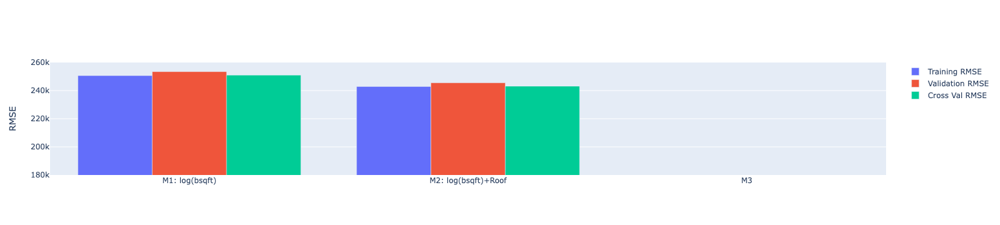

In [48]:
# MODELING STEP 5:  Just run this cell to Plot bar graph comparing RMSEs of Model 2 and Model 1 and side-by-side residuals

model_names[1] = "M2: log(bsqft)+Roof"

fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig


Text(0.5, 1.0, 'Model 2 Val Data: Residuals vs. Log(Sale Price)')

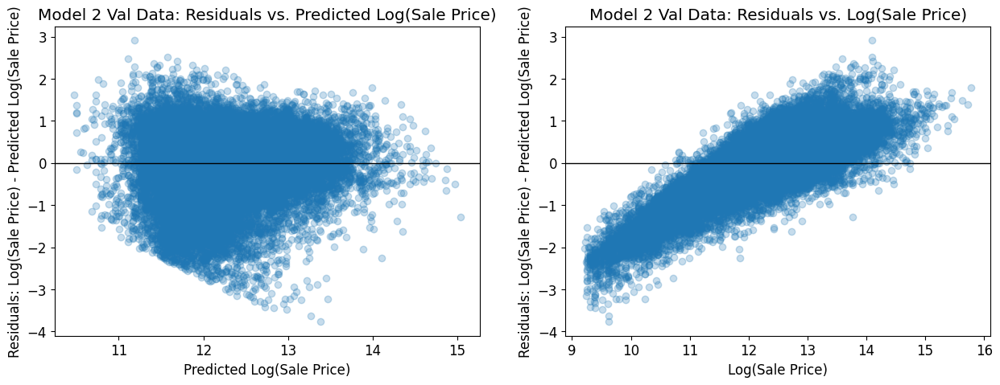

In [49]:
# MODELING STEP 5 cont'd:  Plot 2 side-by-side residual plots (similar to Question 3, for validation data)

fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = y_predict_valid_m2
y_plt1 = y_valid_m2 - y_predict_valid_m2

x_plt2 = y_valid_m2
y_plt2 = y_valid_m2 - y_predict_valid_m2


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 2 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 2 Val Data: Residuals vs. Log(Sale Price)")


In [50]:
grader.check("q5av")

q5av results: All test cases passed!

### Question 5b


We only see a slight decrease in the RMSE with this 2nd model, and our residuals look nearly the same as Model 1, even though the boxplots of Roof Material vs the residuals of Model 1 had indicated it might be a useful feature to add to the model.  

What went wrong?
  
Although there was variation in the boxplots we didn't check the number of data points actually in each different Roof Material Category, which will affect how useful the feature will be in reducing the RMSE.  

To see this, group the `valid_comp` data by Roof Material Type and calculate the proportion of data in each category.  

Set the variable `val_data_prop_roof_type` equal to a `series` with indices given by Roof Material Name and values that are the proportion of validation data of that roof type.

(for example `val_data_prop_roof_type["Shingle/Asphalt"]` should return a float that is the proportion of data points with that type of roof)

In [51]:
#https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html
val_data_prop_roof_type = valid_comp["Roof Material"].value_counts() / len(valid_comp["Roof Material"])

val_data_prop_roof_type

Roof Material
Shingle/Asphalt    0.952293
Tar&Gravel         0.022793
Shake              0.008783
Tile               0.006841
Other              0.005497
Slate              0.003794
Name: count, dtype: float64

In [52]:
grader.check("q5b")

q5b results: All test cases passed!


<br/>
<hr style="border: 1px solid #fdb515;" />

## Question 6:  Improving the Model



<!-- BEGIN QUESTION -->

### Question 6a:  Choose an additional feature

It's your turn to choose another feature to add to the model.  Choose one new **quantitative** (not qualitative) feature and create Model 3 incorporating this feature (along with the features we've already chosen in Model 2).    Try to choose a feature that will have a large impact on reducing the RMSE and/or will improve your residual plots.  This can be a raw feature available in the dataset, or a transformation of one of the features in the dataset, or a new feature that you create from the dataset (see Project 1 for ideas).    

Note:  There is not one single right answer as to which feature to add, however **to receive credit on this question you should make sure the feature decreases the Cross Validation RMSE compared to Model 2 (i.e. we want to improve the model, not make it worse!)** 


In the cell below, explain what additional feature you have chosen and why.  Justify your reasoning.  There are optional code cells provided below for you to use when exploring the dataset to determine which feature to add. 

This problem will be graded based on your reasoning and explanation of the feature you choose, and then on your implementation of incorporating the feature.   

**NOTE** Please don't add additional coding cells below or the Autograder will have issues.  You do not need to use all the coding cells provided.   

### Question 6a Answer Cell:   
In this cell, explain what feature you chose to add and why. Then give the equation for your new model (use the LaTeX from Model 2 from above and then add an additional term).   

In [53]:
print("listing all features to check")
print(tr_val_data.columns.values)


print(tr_val_data["Age"].head(40))



# Show work in this cell exploring data to determine which feature to add

listing all features to check
['PIN' 'Property Class' 'Neighborhood Code' 'Land Square Feet' 'Town Code'
 'Apartments' 'Wall Material' 'Roof Material' 'Basement' 'Basement Finish'
 'Central Heating' 'Other Heating' 'Central Air' 'Fireplaces' 'Attic Type'
 'Attic Finish' 'Design Plan' 'Cathedral Ceiling' 'Construction Quality'
 'Site Desirability' 'Garage 1 Size' 'Garage 1 Material'
 'Garage 1 Attachment' 'Garage 1 Area' 'Garage 2 Size' 'Garage 2 Material'
 'Garage 2 Attachment' 'Garage 2 Area' 'Porch' 'Other Improvements'
 'Building Square Feet' 'Repair Condition' 'Multi Code'
 'Number of Commercial Units' 'Estimate (Land)' 'Estimate (Building)'
 'Deed No.' 'Sale Price' 'Longitude' 'Latitude' 'Census Tract'
 'Multi Property Indicator' 'Modeling Group' 'Age' 'Use' "O'Hare Noise"
 'Floodplain' 'Road Proximity' 'Sale Year' 'Sale Quarter' 'Sale Half-Year'
 'Sale Quarter of Year' 'Sale Month of Year' 'Sale Half of Year'
 'Most Recent Sale' 'Age Decade' 'Pure Market Filter' 'Garage Indicator

<br>

I notice two that stand out. The first is garage 1 size. The second is Age. 

Garage 1 size is my first choice. My thought process is that there may be correlation between garage sizes and prices/house sizes. Lets look:
tr_val_data["Garage 1 Size"].head(40)

After printing, I noticed that there are a decebt amount of 0's (houses with no garages). I do not want to deal with the idea of "missing data" or houses not sharing the same feature of a garage. 
Additionally, I would expect garage size to be similar to building square feet as both would presumebly grow at simialr rates. This means there is not much point in choosing this data
when I already am working with propetry square feet

Lets look at age (above) ****


Just looking at the head of 40 rows, all of the properties have data for this point. This makes sense as an "unmade" property can not be on this list, so it must have an age to be on the list
I will proceed and use age as a feature, as I can see if there is a trend in the age and how it affects the other features.

I am predicting that newer houses are more expensive as are most new "products," so I believe age can help add to this equation.


RETROSPECTIVE NOTE*** I tried AGE and it did not decrease my RMSE, so I tried log age and here we are:

$$\text{Log Sale Price} =  \theta_1(\text{Log Building Square Feet})  +\theta_2 (\text{Shingle/Asphalt})$$

$$+ \theta_3 (\text{Tar\&Gravel}) + \theta_4  (\text{Tile})+ \theta_5 (\text{Shake})+  \theta_6(\text{Other})+\theta_7(\text{Slate}) +\theta_8(\text{Log(Age)})$$




In [54]:



# Optional code cell for additional work exploring data/ explaining which feature you chose.

In [55]:


# Optional code cell for additional work exploring data/ explaining which feature you chose.

In [56]:


# Optional code cell for additional work exploring data/ explaining which feature you chose.

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 6b:  Create Model 3

In the cells below fill in the code to create and analyze Model 3 (follow the Modeling steps outlined above).

PLEASE DO NOT ADD ANY ADDITIONAL CELLS IN THIS PROBLEM OR IT MIGHT MAKE THE AUTOGRADER FAIL

In [57]:
# Modeling Step 1:  Process the Data

# Hint: You can either use your implementation of the One Hot Encoding Function 
#from Project Part 1, or use the staff's implementation

from feature_func import *


# Optional:  Define any helper functions you need for one-hot encoding above this line


def process_data_m3(df):
    
#     data = df.copy()
        
#     data = data.reindex(columns = ["Log Sale Price", "Log Building Square Feet", "Roof Material_Shingle/Asphalt", "Roof Material_Tar&Gravel", "Roof Material_Tile", "Roof Material_Shake", "Roof Material_Other", "Roof Material_Slate", "Age"])

#     return data


    data = df.copy()
    
    d1 = data.filter(items=["Roof Material"])
    #given - Update Roof Material feature with names in example
    d1 = substitute_roof_material(d1)

    #projet 1
    d1 = ohe_roof_material(d1)

    
#     d2 = data["Sale Price"]
    
    #create columns from original data set
    d1["Log Sale Price"] = np.log(data["Sale Price"])
    d1["Log Building Square Feet"] = np.log(data["Building Square Feet"]) 
    d1["Log Age"] = np.log(data["Age"])
   
   
    

    d1 = d1.drop(columns = ["Roof Material"])
    # combined = combined.drop(columns = "Wall Material")
    
    #return df
    #order by equation
    d1 = d1.reindex(columns = ["Log Sale Price", "Log Building Square Feet", "Roof Material_Shingle/Asphalt", "Roof Material_Tar&Gravel", "Roof Material_Tile", "Roof Material_Shake", "Roof Material_Other", "Roof Material_Slate", "Log Age"])
    return d1
    

# Process the data for Model 3 (using the same tr and val datatsets we created in Question 3) 
processed_train_m3 = process_data_m3(tr) 

processed_val_m3 = process_data_m3(val) 

# Create X (Dataframe) and y (series) to use to train the model
X_train_m3 = processed_train_m3.drop(columns = "Log Sale Price")
y_train_m3 = processed_train_m3["Log Sale Price"]

X_valid_m3 = processed_val_m3.drop(columns = "Log Sale Price")
y_valid_m3 = processed_val_m3["Log Sale Price"]


# Take a look at the result
display(X_train_m3.head())
display(y_train_m3.head())

display(X_valid_m3.head())
display(y_valid_m3.head())


,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate,Log Age
21302,6.871091,1.0,0.0,0.0,0.0,0.0,0.0,4.276666
19451,7.576610,1.0,0.0,0.0,0.0,0.0,0.0,4.736198
32018,6.891626,1.0,0.0,0.0,0.0,0.0,0.0,4.248495
144262,7.186901,1.0,0.0,0.0,0.0,0.0,0.0,4.007333
197227,7.576610,1.0,0.0,0.0,0.0,0.0,0.0,4.465908


21302     11.738466
19451     12.100712
32018     12.577291
144262    12.502467
197227    12.449019
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate,Log Age
17112,7.487174,1.0,0.0,0.0,0.0,0.0,0.0,4.043051
189337,7.688913,1.0,0.0,0.0,0.0,0.0,0.0,4.644391
141725,6.985642,1.0,0.0,0.0,0.0,0.0,0.0,4.127134
9776,6.846943,1.0,0.0,0.0,0.0,0.0,0.0,4.499810
81676,7.096721,1.0,0.0,0.0,0.0,0.0,0.0,4.158883


17112     12.100707
189337    12.460715
141725    12.165251
9776      11.982929
81676     11.719940
Name: Log Sale Price, dtype: float64

In [58]:
# Modeling STEP 2:  Create and Fit a Multiple Linear Regression Model
linear_model_m3 = lm.LinearRegression()
X = X_train_m3

Y = y_train_m3

linear_model_m3 = lm.LinearRegression().fit(X,Y)

# your code above this line to create and fit regression model for Model 3

y_predict_train_m3 = linear_model_m3.predict(X_train_m3)

y_predict_valid_m3 = linear_model_m3.predict(X_valid_m3)




In [59]:
# MODELING STEP 3:  Evaluate the RMSE for your model


# Training and validation errors for the model (in units dollars, not log(dollars))

training_error[2] = rmse(np.e**y_predict_train_m3, np.e**y_train_m3)
validation_error[2] = rmse(np.e**y_predict_valid_m3, np.e**y_valid_m3)


(print("3rd Model \nTraining RMSE: $ {}\nValidation RMSE: {}\n"
       .format(training_error[2], validation_error[2]))
)


3rd Model 
Training RMSE: $ 240558.38996973576
Validation RMSE: 243137.6408890049



In [60]:

# MODELING STEP 4:  Conduct 5-fold cross validation for model and output RMSE

linear_model_m3_cv = lm.LinearRegression()


# Process the entire cleaned training_val dataset using the m3 pipeline
processed_full_m3 = process_data_m3(tr_val_clean)

# Split the processed_full_m3 Dataset into X and y to use in models.
X_full_m3 = processed_full_m3.drop(columns = "Log Sale Price")
y_full_m3 = processed_full_m3["Log Sale Price"]


# Run cross_validate_rmse function:
cv_error_m3  = cross_validate_rmse(linear_model_m3_cv, X_full_m3, y_full_m3)

# Save the cross validation error for model 3 in our list to compare different models:

cv_error[2] = cv_error_m3

print("3rd Model Cross Validation RMSE: {}".format(cv_error[2]))




3rd Model Cross Validation RMSE: 240804.52310877488


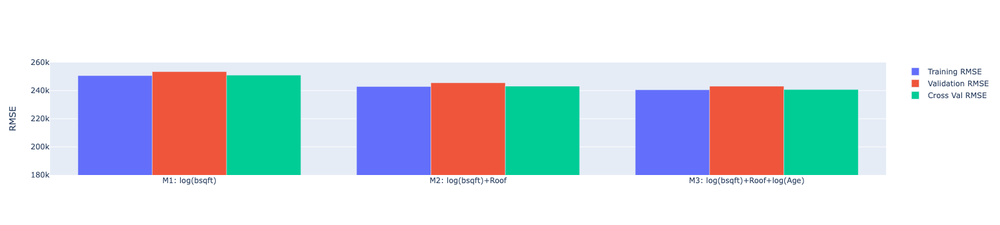

In [61]:
# MODELING STEP 5:  Add a name for your 3rd model describing the features 
#and run this cell to Plot bar graph all 3 models

model_names[2] = "M3: log(bsqft)+Roof+log(Age)"


fig = go.Figure([
go.Bar(x = model_names, y = training_error, name="Training RMSE"),
go.Bar(x = model_names, y = validation_error, name="Validation RMSE"),
go.Bar(x = model_names, y = cv_error, name="Cross Val RMSE")
])

fig.update_yaxes(range=[180000,260000], title="RMSE")

fig


Text(0.5, 1.0, 'Model 3 Val Data: Residuals vs. Log(Sale Price)')

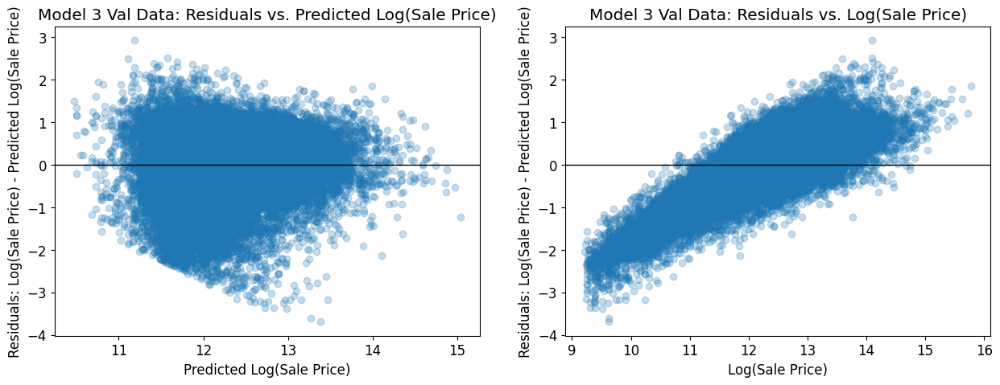

In [62]:
# MODELING STEP 5 cont'd:  Plot 2 side-by-side residual plots 
#(similar to Question 3, for validation data)

fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = y_predict_valid_m2
y_plt1 = y_valid_m3 - y_predict_valid_m3

x_plt2 = y_valid_m3
y_plt2 = y_valid_m3 - y_predict_valid_m3


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("Model 3 Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("Model 3 Val Data: Residuals vs. Log(Sale Price)")


In [63]:
grader.check("q6b")

q6b results: All test cases passed!

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Question 6c

 - 6ci).  Comment on your RMSE and residual plots from Model 3 compared to the first 2 models.  

 - 6cii).  Are the residuals of your model still showing a trend that overestimates lower priced houses and underestimates higher priced houses?   If so, how could you try to address this in the next round of modeling?

 - 6ciii).  If you had more time to improve your model, what would your next steps be?


i). The RMSE of model 3 is the least of the 3 models. Looking at the residuals, there is slightly more condensed data points which is what we want (as long as there is no pattern)

ii/iii). The residuals aer still showing a trend that overestimates lower priced houses and underestimates higher priced houses. We know this because the lower priced houses have a negative residudal (y) value, and higher priced houses have a positive (or increased) residual value (y value on graph). This represents the trend as the y values are the logs of the actual prices - predicted, so if the value is negative/lower (as it is with lower priced houses), then the predicted is over estimating the house (and opposite for higher priced hosues). To fix this (and try to imporve my model), I would print out sale prices versus other columns (other than age), and try to see what additional theta/feature may fix this. I would look for a feature where when compared to sale price, is lower with lower sale prices and higher with higher sale prices. I would then use a bulge diagram to see how I may need to adjust the data (which I should have done with Age but instead had to test Age, then when the RMSE did not go down, test again with log(Age).


<!-- END QUESTION -->

<hr style="border: 1px solid #fdb515;" />

## Question 7: Evaluating the Model in Context

<br>

<!-- BEGIN QUESTION -->

---
## Question 7a

When evaluating your model, we used RMSE. In the context of estimating the value of houses, what does the residual mean for an individual homeowner? How does it affect them in terms of property taxes? Discuss the cases where residual is positive and negative separately.

The residual demonstrates how heavy the homeowners taxes are relative their house sale price compared to the other homeowners in the data. Higher RMSE means that homeowners are being less taxed and lower RMSE means homeowners are being taxed heavier. Because this was modeled in terms of house Sale Price, homeowners can then see if they are being under or overtaxed due relative to others in the data based on their house sale price.

<!-- END QUESTION -->

In the case of the Cook County Assessor’s Office, Chief Data Officer Rob Ross states that fair property tax rates are contingent on whether property values are assessed accurately - that they’re valued at what they’re worth, relative to properties with similar characteristics. This implies that having a more accurate model results in fairer assessments. The goal of the property assessment process for the CCAO, then, is to be as accurate as possible. 

When the use of algorithms and statistical modeling has real-world consequences, we often refer to the idea of fairness as a measurement of how socially responsible our work is. Fairness is incredibly multifaceted: Is a fair model one that minimizes loss - one that generates accurate results? Is it one that utilizes "unbiased" data? Or is fairness a broader goal that takes historical contexts into account?

These approaches to fairness are not mutually exclusive. If we look beyond error functions and technical measures of accuracy, we'd not only consider _individual_ cases of fairness, but also what fairness - and justice - means to marginalized communities on a broader scale. We'd ask: What does it mean when homes in predominantly Black and Hispanic communities in Cook County are consistently overvalued, resulting in proportionally higher property taxes? When the white neighborhoods in Cook County are consistently undervalued, resulting in proportionally lower property taxes? 

Having "accurate" predictions doesn't necessarily address larger historical trends and inequities, and fairness in property assessments in taxes works beyond the CCAO's valuation model. Disassociating accurate predictions from a fair system is vital to approaching justice at multiple levels. Take Evanston, IL - a suburb in Cook County - as an example of housing equity beyond just improving a property valuation model: Their City Council members [recently approved reparations for African American residents](https://www.usnews.com/news/health-news/articles/2021-03-23/chicago-suburb-approves-government-reparations-for-black-residents).

<!-- BEGIN QUESTION -->

<br>

---

## Question 7b

Reflecting back on your exploration in Questions 5 and 6a, in your own words, what makes a model's predictions of property values for tax assessment purposes "fair"? 

This question is open-ended and part of your answer may depend upon your specific model; we are looking for thoughtfulness and engagement with the material, not correctness. 

**Hint:** Some guiding questions to reflect on as you answer the question above: What is the relationship between RMSE, accuracy, and fairness as you have defined it? Is a model with a low RMSE necessarily accurate? Is a model with a low RMSE necessarily "fair"? Is there any difference between your answers to the previous two questions? And if so, why?

What would make this model's predicts fair in terms of tax assessment purposes would be predicting residuals that are minimized (demonstrating accuracy), higher for lower priced houses, and lower for higher priced houses. Because our residuals of the model is (actual price - predicted), higher residuals mean that it is underestimating taxes. Fair would not demonstrate the pattern found above, where higher priced houses are undertaxed (as shown with a higher residual), but rather an opposite trend where less priced houses are taxed less than higher priced houses. This means higher residuals for lower priced houses, and lower residuals for higher priced houses.  

<!-- END QUESTION -->

<hr style="border: 1px solid #fdb515;" />

## Extra Credit:  How Low Can You Go?   Create Your Own Model and Check RMSE on the Test Data

<br>

---



For **extra credit**, you can create your own model to try to improve the RMSE and residual plots even further. 

The tables below provide scoring guidelines for the extra credit opportunity in this problem. 
If your RMSE lies in a particular range, you will receive the number of points associated with that range.



### Extra Credit Grading Scheme

**Important**: To avoid memory issues we will only be using simple cross validation, not 5-fold cross validation in this extra credit part.  While your Validation RMSE can be checked at any time in this notebook, your Test RMSE can only be checked once by submitting your model’s predictions to Gradescope. The thresholds are as follows:

Extra Credit Points | +10 | +8 | +6  | +4 | + 2
--- | --- | --- | --- | --- | ---
Validation RMSE | Less than 200k | [200k, 210k) | [210k, 220k) | [220k, 230k)  | [230k, 235k)

Extra Credit Points | +10 | +8 | +6  | +4 | + 2
--- | --- | --- | --- | --- | ---
Test RMSE | Less than 200k | [200k, 210k) | [210k, 220k) | [220k, 230k)| [230k, 235k)

<br><br>

To receive these points, you need to show your work in the cells below AND complete the EXPLANATION STEP at the end (explaining what you did to create your model).  

You ALSO MUST UPLOAD your test prediction .csv to the **"Project 2 Extra Credit Test Predictions"** assignment in Gradescope to receive extra credit for your test predictions.

---

## Some notes before you start

- **If you are running into memory issues, restart the kernel and only run the cells you need to.**   If needed you can use the commented cell below (question cell) that contains most to all of the imports necessary to successfully complete this portion of the project, so it can be completed independently code-wise from the remainder of the project, and you do not need to rerun the cell at the top of this notebook. The autograder will have more than 4GB of memory, so you will not lose credit as long as your solution to this question is within the total memory (4GB) limits of DataHub. By default, we reset the memory and clear all variables using `%reset -f`. If you want to delete specific variables, you may also use `del` in place of `%reset -f%`. For example, the following code will free up memory from data used for older models: `del tr_val_data, test_data, tr, val, X_train_m1, X_valid_m1, X_train_m2, X_valid_m1`. Our staff solution can be run independently from all other questions, so we encourage you to do the same to make debugging easier.
- Tip: Feel free to try using [regularization](https://learningds.org/ch/16/ms_regularization.html) for model selection. 
- To avoid memory issues, you do not need to include cross validation for this step.  Your score will be based on the Validation Data set RMSE and the Test dataset RMSE.
- **Note: If you need the data again after deleting the variables or resetting, you must reload them again.**
- You will be predicting `Log Sale Price` on the data stored in `cook_county_contest_test.csv`. We will delog/exponentiate your prediction on Gradescope to compute RMSE and use this to score your model. Before submitting to Gradescope, make sure that your predicted values can all be delogged (i.e., if one of your `Log Sale Price` predictions is 60, it is too large; $e^{60}$ is too big!)
- You MUST remove any additional new cells you add before submitting to Gradescope to avoid any autograder errors. 


**PLEASE READ THE ABOVE MESSAGE CAREFULLY!**

**Hints:** 
- Some features may have missing values in the test set but not in the training set (especially if you're one-hot-encoding). Make sure `process_data_ec` handles missing values appropriately for each feature!



In [64]:
#tr_val_data[tr_val_data["Land Square Feet"]>400000].head(40)
tr_val_data["Roof Material"].head(40)

#cutoff will be 500000
#I printed land square feet more than 100,000, 200,000 and 300,000 and there were 40+ properties for all of them. >4000000 is ony 29 properties so I will make 400,000 my cutoff.


# Optional code cell for additional work exploring data/ explaining which feature you chose.
# You can add additional code cells directly below this if needed.

0     1.0
1     1.0
2     1.0
3     1.0
4     1.0
5     1.0
6     1.0
7     1.0
8     2.0
9     1.0
10    1.0
11    1.0
12    1.0
13    1.0
14    1.0
15    1.0
16    1.0
17    1.0
18    1.0
19    1.0
20    1.0
21    1.0
22    1.0
23    1.0
24    1.0
25    1.0
26    1.0
27    1.0
28    1.0
29    1.0
30    1.0
31    1.0
32    1.0
33    1.0
34    6.0
35    1.0
36    1.0
37    1.0
38    1.0
39    1.0
Name: Roof Material, dtype: float64

In [65]:
# import seaborn as sns
# sns.lmplot(data = tr_val_data.head(50), x="Fireplace", y="Sale Price", scatter=True,) # facet_kws={'xlim': (230, 300), 'ylim':(88,135)})
# Optional code cell for additional work exploring data/ explaining which feature you chose.

In [66]:
#Optional cell to try if you're having memory issues (i.e. if kernel keeps dying)


# If you're having memory issues, uncomment the lines below to clean up 
#memory from previous questions and reinitialize Otter!



# MAKE SURE TO RECOMMENT THE NEXT 3 LINES OUT BEFORE SUBMITTING!

#%reset -f
#import otter
#grader = otter.Notebook("ProjPart2.ipynb")


#import numpy as np
#import pandas as pd
#from pandas.api.types import CategoricalDtype

#%matplotlib inline
#import matplotlib.pyplot as plt
#import seaborn as sns
#from sklearn import linear_model as lm

#import warnings
#warnings.filterwarnings("ignore")

#import zipfile
#import os

#import plotly.graph_objects as go

#from ds100_utils import *
#from feature_func import *




#tr_val_data = pd.read_csv("cook_county_train_val.csv", index_col='Unnamed: 0')
#test_data = pd.read_csv("cook_county_contest_test.csv", index_col='Unnamed: 0')

# COPY THESE FUNCTIONS FROM ABOVE

#def rmse(predicted, actual):


#def clean_data(data):
    
    

#tr_val_clean = clean_data(tr_val_data) 

    


#def train_val_split(data):



    
    


## To ensure reproducibility, we will shuffle the data once before running it through the train_val split function
#tr_val_data_shuffled = tr_val_data.sample(frac=1, random_state=18)

## Clean the data
#tr_val_clean = clean_data(tr_val_data_shuffled) 

## Create the train/val split on the cleaned, shuffled data:
#tr, val = train_val_split(tr_val_clean)





<!-- BEGIN QUESTION -->

## Extra Credit Step 1: Creating Your Model
Complete the modeling steps (you can skip the cross validation step to save memory) in the cells below.

DO NOT ADD ANY EXTRA CELLS BELOW (for this part of the problem)

# Please include all of your feature engineering processes 
    # for the training, validation and test sets.
    # dataset_type is a flag to use as follows:
    # dataset_type=1  imples the data is the training data
    # dataset_type=2 implies the data is the validation data
    # dataset_type = 3 imples the data is the test data

    #Important Instructions:
    # When processing the training data, you CAN drop any rows/data that you deem to be outliers
    # When processing the validation data you CANNOT drop any rows
    # When processing the test data, you CANNOT drop any rows, and you CANNOT reference "Sale Price", as it is not in the test data.

In [67]:
# Modeling Step 1:  Process the Data


# Hint: You can either use your implementation of the One Hot Encoding Function from 
#Project Part 1, or use the staff's implementation
from feature_func import *


def substitute_wall_material(data):
    """
    Input:
      data (data frame): a data frame containing a 'Roof Material' column.  Its values
                         should be limited to those found in the codebook
    Output:
      data frame identical to the input except with a refactored 'Roof Material' column
    """
    replacements = {
        'Wall Material': {
            1: 'Wood',
            2: 'Masonry',
            3: 'Wood&Masonry',
            4: 'Stucco',
           
        }
        

    }

    data = data.replace(replacements)
    return data

def ohe_wall_material(data):
    """
    One-hot-encodes roof material.  New columns are of the form x0_MATERIAL.
    """
    ...
    # BEGIN SOLUTION NO PROMPT
    oh_enc = OneHotEncoder()
    oh_enc.fit(data[['Wall Material']])
    dummies = pd.DataFrame(oh_enc.transform(data[['Wall Material']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = data.index)
    return data.join(dummies)



def substitute_basement(data):
    """
    Input:
      data (data frame): a data frame containing a 'Roof Material' column.  Its values
                         should be limited to those found in the codebook
    Output:
      data frame identical to the input except with a refactored 'Roof Material' column
    """
    replacements = {
        'Basement': {
            1: 'Full',
            2: 'Slab',
            3: 'Partial',
            4: 'Crawl',
           
        }
        

    }

    data = data.replace(replacements)
    return data

def ohe_basement(data):
    """
    One-hot-encodes roof material.  New columns are of the form x0_MATERIAL.
    """
    ...
    # BEGIN SOLUTION NO PROMPT
    oh_enc = OneHotEncoder()
    oh_enc.fit(data[['Basement']])
    dummies = pd.DataFrame(oh_enc.transform(data[['Basement']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = data.index)
    return data.join(dummies)

def substitute_basement_finish(data):
    """
    Input:
      data (data frame): a data frame containing a 'Roof Material' column.  Its values
                         should be limited to those found in the codebook
    Output:
      data frame identical to the input except with a refactored 'Roof Material' column
    """
    replacements = {
        'Basement Finish': {
            1: 'Formal rec room',
            2: 'Apartment',
            3: 'Unfinished',
          
           
        }
        

    }

    data = data.replace(replacements)
    return data

def ohe_basement_finish(data):
    """
    One-hot-encodes roof material.  New columns are of the form x0_MATERIAL.
    """
    # BEGIN SOLUTION NO PROMPT
    oh_enc = OneHotEncoder()
    oh_enc.fit(data[['Basement Finish']])
    dummies = pd.DataFrame(oh_enc.transform(data[['Basement Finish']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = data.index)
    return data.join(dummies)


def substitute_other_heating(data):
    """
    Input:
      data (data frame): a data frame containing a 'Roof Material' column.  Its values
                         should be limited to those found in the codebook
    Output:
      data frame identical to the input except with a refactored 'Roof Material' column
    """
    replacements = {
        'Other Heating': {
            1: 'Floor furnace',
            2: 'Unit heater',
            3: 'Stove',
            4: 'Solar',
            5: 'None'
          
           
        }
        

    }

    data = data.replace(replacements)
    return data

def ohe_other_heating(data):
    """
    One-hot-encodes roof material.  New columns are of the form x0_MATERIAL.
    """
    # BEGIN SOLUTION NO PROMPT
    oh_enc = OneHotEncoder()
    oh_enc.fit(data[['Other Heating']])
    dummies = pd.DataFrame(oh_enc.transform(data[['Other Heating']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = data.index)
    return data.join(dummies)


# # Optional:  Define any helper functions you need (for example, for one-hot 
# #encoding, etc) above this line


def process_data_ec(df, dataset_type):

    """
    Function that includes all feature engineering processes 
    for the training, validation and test sets for your extra credit model.
   
    Important Instructions:
    When processing the training data, you CAN drop any rows/data that you deem to be outliers
    When processing the validation data you CANNOT drop any rows (even what you deem to be an outlier)
    When processing the test data, you CANNOT drop any rows, and you CANNOT reference "Sale Price", as it is not in the test data.

    dataset_type is a flag to use as follows:
        dataset_type=1  implies the data is the training data
        dataset_type=2 implies the data is the validation data
        dataset_type = 3 imples the data is the test data
    
    """
    


    data = df.copy()
    
    d1 = data.filter(items=["Roof Material", "Wall Material", "Basement", "Basement Finish"]) #, "Other Heating"])
    #given - Update Roof Material feature with names in example
    d1 = substitute_roof_material(d1)
    d1 = substitute_wall_material(d1)
    d1 = substitute_basement(d1)
    d1 = substitute_basement_finish(d1)
  #  d1 = substitute_other_heating(d1)
    #projet 1
    d1 = ohe_roof_material(d1)
    d1 = ohe_wall_material(d1)
    d1 = ohe_basement(d1)
    d1 = ohe_basement_finish(d1)
   # d1 = ohe_other_heating(d1)
    
#     d2 = data["Sale Price"]
    
    #create columns from original data set
    if(dataset_type != 3):
        d1["Log Sale Price"] = np.log(data["Sale Price"])
        
    d1["Log Building Square Feet"] = np.log(data["Building Square Feet"]) 
    d1["Log Age"] = np.log(data["Age"])
    d1["Sale Year"] = data["Sale Year"]
    d1["Fireplaces"] = data["Fireplaces"]
   
   
    

    d1 = d1.drop(columns = ["Roof Material", "Wall Material", "Basement", "Basement Finish"]) #, "Other Heating"])
    # combined = combined.drop(columns = "Wall Material")
    
    #return df
    #order by equation
    if(dataset_type !=3):
        d1 = d1.reindex(columns = ["Log Sale Price", 
                               "Log Building Square Feet",
                               "Roof Material_Shingle/Asphalt", "Roof Material_Tar&Gravel", "Roof Material_Tile", "Roof Material_Shake", "Roof Material_Other", "Roof Material_Slate", 
                               "Log Age", "Wall Material_Wood", "Wall Material_Masonry", "Wall Material_Wood&Masonry", "Wall Material_Stucco",
                             "Basement_Full", "Basement_Slab", "Basement_Partial", "Basement_Crawl",
                               "Basement Finish_Formal rec room", "Basement Finish_Unfinished", "Sale Year", "Fireplaces"
                                
                              ])
    else:
        d1 = d1.reindex(columns = ["Log Building Square Feet",
                               "Roof Material_Shingle/Asphalt", "Roof Material_Tar&Gravel", "Roof Material_Tile", "Roof Material_Shake", "Roof Material_Other", "Roof Material_Slate", 
                               "Log Age", "Wall Material_Wood", "Wall Material_Masonry", "Wall Material_Wood&Masonry", "Wall Material_Stucco",
                             "Basement_Full", "Basement_Slab", "Basement_Partial", "Basement_Crawl",
                               "Basement Finish_Formal rec room", "Basement Finish_Unfinished", "Sale Year", "Fireplaces"
                                
                              ])
    #"Other Heating_Floor furnace", "Other Heating_Unit heater", "Other Heating_Stove", "Other Heating_Solar", "Other Heating_None"

    return d1


# Use the same original train and valid datasets from 3a (otherwise the 
# validation errors aren't comparable).  Don't resplit the data.  
    
# Process the data 
processed_train_ec = process_data_ec(tr, dataset_type=1)

processed_val_ec = process_data_ec(val, dataset_type=2)


X_train_ec = processed_train_ec.drop(columns = "Log Sale Price")
y_train_ec = processed_train_ec["Log Sale Price"]

X_valid_ec = processed_val_ec.drop(columns = "Log Sale Price")
y_valid_ec = processed_val_ec["Log Sale Price"]



# Take a look at the result
display(X_train_ec.head())
display(y_train_ec.head())

display(X_valid_ec.head())
display(y_valid_ec.head())

,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate,Log Age,Wall Material_Wood,Wall Material_Masonry,Wall Material_Wood&Masonry,Wall Material_Stucco,Basement_Full,Basement_Slab,Basement_Partial,Basement_Crawl,Basement Finish_Formal rec room,Basement Finish_Unfinished,Sale Year,Fireplaces
21302,6.871091,1.0,0.0,0.0,0.0,0.0,0.0,4.276666,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2019,0.0
19451,7.576610,1.0,0.0,0.0,0.0,0.0,0.0,4.736198,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2014,0.0
32018,6.891626,1.0,0.0,0.0,0.0,0.0,0.0,4.248495,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2019,0.0
144262,7.186901,1.0,0.0,0.0,0.0,0.0,0.0,4.007333,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2015,1.0
197227,7.576610,1.0,0.0,0.0,0.0,0.0,0.0,4.465908,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2016,1.0


21302     11.738466
19451     12.100712
32018     12.577291
144262    12.502467
197227    12.449019
Name: Log Sale Price, dtype: float64

,Log Building Square Feet,Roof Material_Shingle/Asphalt,Roof Material_Tar&Gravel,Roof Material_Tile,Roof Material_Shake,Roof Material_Other,Roof Material_Slate,Log Age,Wall Material_Wood,Wall Material_Masonry,Wall Material_Wood&Masonry,Wall Material_Stucco,Basement_Full,Basement_Slab,Basement_Partial,Basement_Crawl,Basement Finish_Formal rec room,Basement Finish_Unfinished,Sale Year,Fireplaces
17112,7.487174,1.0,0.0,0.0,0.0,0.0,0.0,4.043051,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2018,0.0
189337,7.688913,1.0,0.0,0.0,0.0,0.0,0.0,4.644391,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2018,0.0
141725,6.985642,1.0,0.0,0.0,0.0,0.0,0.0,4.127134,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2018,0.0
9776,6.846943,1.0,0.0,0.0,0.0,0.0,0.0,4.499810,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2017,0.0
81676,7.096721,1.0,0.0,0.0,0.0,0.0,0.0,4.158883,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2018,0.0


17112     12.100707
189337    12.460715
141725    12.165251
9776      11.982929
81676     11.719940
Name: Log Sale Price, dtype: float64

In [68]:
# Run this code to make sure you haven't dropped any of the rows in the validation set

assert X_valid_ec.shape[0] == 33475

In [69]:
# Modeling STEP 2:  Create a Multiple Linear Regression Model


linear_model_ec = lm.LinearRegression()
X = X_train_ec
Y = y_train_ec

linear_model_ec = lm.LinearRegression().fit(X,Y)
# your code above this line to create regression model 

y_predict_train_ec = linear_model_ec.predict(X_train_ec)

y_predict_valid_ec = linear_model_ec.predict(X_valid_ec)




In [70]:
# MODELING STEP 3:  Evaluate the RMSE for your model


# Training and test errors for the model 
#(in its original values before the log transform)

training_error_ec = rmse(np.e**y_predict_train_ec, np.e**y_train_ec)
validation_error_ec = rmse(np.e**y_predict_valid_ec, np.e**y_valid_ec)


(print("Extra Credit \nTraining RMSE:$ {}\nValidation RMSE:$ {}\n"
       .format(training_error_ec, validation_error_ec))
)



Extra Credit 
Training RMSE:$ 228842.27872157504
Validation RMSE:$ 231189.10267191043



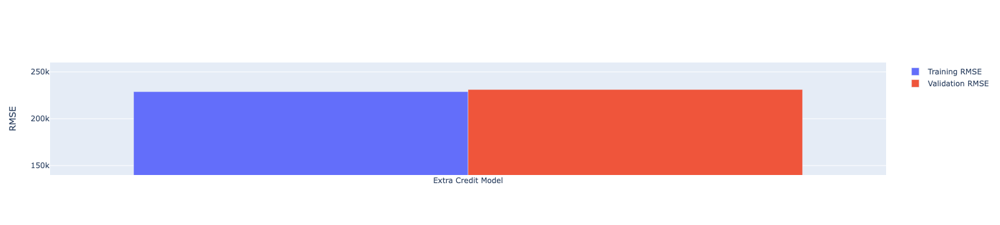

In [71]:
# Optional: Run this cell to visualize

#import plotly.graph_objects as go

fig = go.Figure([
go.Bar(x = ["Extra Credit Model"], y = [training_error_ec], name="Training RMSE"),
go.Bar(x = ["Extra Credit Model"], y = [validation_error_ec], name="Validation RMSE"),

])


fig
fig.update_yaxes(range=[140000,260000], title="RMSE")
# Feel free to update the range as needed

Text(0.5, 1.0, 'EC Val Data: Residuals vs. Log(Sale Price)')

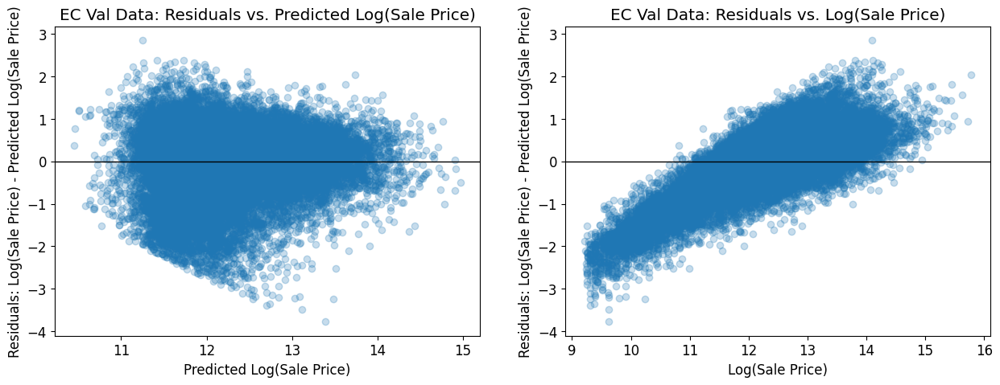

In [72]:
# MODELING STEP 5: Plot 2 side-by-side residual plots for validation data

fig, ax = plt.subplots(1,2, figsize=(15, 5))


x_plt1 = y_predict_valid_ec
y_plt1 = y_valid_ec - y_predict_valid_ec

x_plt2 = y_valid_ec
y_plt2 = y_valid_ec - y_predict_valid_ec


ax[0].scatter(x_plt1, y_plt1, alpha=.25)
ax[0].axhline(0, c='black', linewidth=1)
ax[0].set_xlabel(r'Predicted Log(Sale Price)')
ax[0].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[0].set_title("EC Val Data: Residuals vs. Predicted Log(Sale Price)")

ax[1].scatter(x_plt2, y_plt2, alpha=.25)
ax[1].axhline(0, c='black', linewidth=1)
ax[1].set_xlabel(r'Log(Sale Price)')
ax[1].set_ylabel(r'Residuals: Log(Sale Price) - Predicted Log(Sale Price)');
ax[1].set_title("EC Val Data: Residuals vs. Log(Sale Price)")


<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

## Extra Credit Step 2:  Explanation (Required for points on model above):

 - Explain what you did to create your model.  What versions did you try?  What worked and what didn't? 

 - Comment on the RMSE and residual plots from your model.   Are the residuals of your model still showing a trend that overestimates lower priced houses and underestimates higher priced houses?

**Write your answers in the text cell below**


I went through several steps to create my model. First, I set up a graph of age vs sale price. I did this because I know sale price dropped my rmse in part 6. With this graph, I figured I could then replace age with a different feature and see the pattern between it and sale price, where I would then use the buldge diagram to predict what transofmation to use. I did this to save time, however, when plugging in my first few features, it did not appaer to show any pattern that I could use with the bulge. Because of this, I stopped using the graph and switched to one hot encoding (because we know this worked for roof materials). I started with wall materials, as it is a similar category to roof materials so I guessed it worked from my RMSE. Sure enough, it did so I kept it. I repeated this process for other features (such as attic finish, type, and basement finish and type). This worked for some and not for others. Because I wanted a lower RMSE, I kept the features that decreased the RMSE. Additionally to this problem (of some not working), there were some features I wanted ot use but did not. I theorized that construction quality would have an impact and trend, but then when going to code I saw that the codebook stated that it would not. After this, I went back to numbered features (where I did not have to OHE, such as fireplaces which was simply the count of fireplaces). Here, I guessed and checked with several features until I got an RMSE I was satisfied with.

My finals were:
Training RMSE:$ 228842.27872157504
Validation RMSE:$ 231189.10267191043

These are signficantly lower than my RMSE's in part 6. That being said, there is still clearly a trend of overestimating lower priced houses and underestimating higher priced houses as shown in the graph above. Because a greater RMSE means underestimating (as our equation is actual - predicted aka estimated), and overestimating for the oposite, we can see above that the pattern of overestimating lower priced houses still occurs. 

<!-- END QUESTION -->

## Extra Credit Step 3: Create and Submit Test Set Predictions to Gradescope

Now it's time to test your model on the actual test set.  You are only allowed to submit to Gradescope once, so wait until you have the best version of your model.    

The test data is in the dataframe `test_data`.  

Process the test data and run it through your model. Store your predictions from the test_data in the variable `y_test_pred`.  These should be in units Log Sale Price (you do not need to exponentiate them).  

Then run the cell provided below to create a .csv file to store your predictions on the test set and submit this .csv to the Gradescope Assignment: **"Project 2 Extra Credit Test Predictions"**. 
Note that **you will not receive credit for the test set predictions (i.e. up to 10 points) unless you submit your.csv to the Gradescope assignment**!


In [73]:
# Cells to process the test_data and run the model on it.  
# You CAN add any additional cells below
# Note: Make sure you don't remove any of the rows from the test data set.

processed_test_ec = process_data_ec(test_data, dataset_type = 3) 


y_test_pred = linear_model_ec.predict(processed_test_ec)

In [74]:
# Run this cell to make sure that your values are in log(Sale Price) and not Sale Price
assert (y_test_pred.max())< 25

In [75]:
# Run this cell to make sure you did not drop any of the rows in the original test dataset
assert len(y_test_pred) == 55311

In [76]:
# Run this file to create the .csv of your predictions for the test set to upload to the assignment in Gradescope labeled Project 2 Extra Credit Test Predictions to have it checked.


#Store your predictions for the test set in Y_test_pred 
#(these should be in units of Log Sale Price)


# Construct and save the submission:
submission_df = pd.DataFrame({
    "Id": pd.read_csv('cook_county_contest_test.csv')['Unnamed: 0'], 
    "Value": y_test_pred,
}, columns=['Id', 'Value'])
submission_df.to_csv("submission.csv", index=False)

print('Created a CSV file:')
print('You MUST now upload this CSV file to the Gradescope assignment "Project 2 Extra Credit Test Predictions" for scoring.')

Created a CSV file:
You MUST now upload this CSV file to the Gradescope assignment "Project 2 Extra Credit Test Predictions" for scoring.


## Congratulations! You have finished the Project - Part 2


### Submission Instructions

Before proceeding any further, **save this notebook.**

After running the `grader.export()` cell provided below, **2 files will be created**: a zip file and pdf file.  You can download them using the links provided below OR by finding them in the same folder where this juptyer notebook resides in your JuptyerHub.

To receive credit on this assignment, **you must submit BOTH of these files
to their respective Gradescope portals:** 

* **Project Part 2 Autograded**: Submit the zip file that is output by the `grader.export()` cell below to the Autograded assignment in Gradescope.

* **Project Part 2 Manually Graded**: Submit your ProjectPart2.PDF to the  Manually Graded assignment in Gradescope.  **YOU MUST SELECT THE PAGES CORRESPONDING TO EACH QUESTION WHEN YOU UPLOAD TO GRADESCOPE.  IF NOT, YOU WILL LOSE POINTS**   Also, **check** that all of your plots **and** all lines of your code are showing up in your PDF before submitting.  If not, you will not receive credit for your plots/code.  

* **Extra Credit Submission**:  If you completed the extra credit, to receive credit for the Test Case prediction you must submit your Test Case prediction.csv (generated in the last cell of the extra credit section) to the Gradescope assignment titled "Project 2 Extra Credit Test Predictions"

**You are responsible for ensuring your submission follows our requirements. We will not be granting regrade requests nor extensions to submissions that don't follow instructions.** If you encounter any difficulties with submission, please don't hesitate to reach out to staff prior to the deadline.

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

AFTER running the cell below, click on <a href='ProjPart2.pdf' download>this link to download the PDF </a> to upload to Gradescope.  There will be a separate link that appears after running the cell below with a link to download the zip file to upload to Gradescope.

In [77]:
# Save your notebook first, then run this cell to export your submission.
grader.export(run_tests=True)

Running your submission against local test cases...


Your submission received the following results when run against available test cases:

    q1c results: All test cases passed!

    q2a results: All test cases passed!

    q2c results: All test cases passed!

    q2d results: All test cases passed!

    q3 results: All test cases passed!

    q4a results: All test cases passed!

    q4b results: All test cases passed!

    q4c results: All test cases passed!

    q4d results: All test cases passed!

    q4e results: All test cases passed!

    q4f results: All test cases passed!

    q4g results: All test cases passed!

    q5ai results: All test cases passed!

    q5aii results: All test cases passed!

    q5aiii results: All test cases passed!

    q5aiv results: All test cases passed!

    q5av results: All test cases passed!

    q5b results: All test cases passed!

    q6b results: All test cases passed!
